In [3]:
import numpy as np
import pandas as pd
from scipy.special import expit as inv_logit
from scipy.stats import beta, norm
from math import exp

# Settings
# N = 1000           # Total observations
M = 4             # Number of groups
n_language = 3
n_metric = 2
n_task = 2
n_repetitions = 10

# Hyperparameters (true values)
mu_alpha = 0.0
sigma_alpha = 1.0

mu_beta_language_raw = np.random.normal(0, 0.5, n_language-1)
mu_beta_language = np.concatenate([mu_beta_language_raw, [-mu_beta_language_raw.sum()]])
sigma_beta_language = 0.3

beta_metric_raw = np.random.normal(0, 0.5, size=n_metric - 1)
beta_metric = np.concatenate([beta_metric_raw, [-beta_metric_raw.sum()]])

mu_beta_task_raw = np.random.normal(0, 0.5, n_task-1)
mu_beta_task = np.concatenate([mu_beta_task_raw, [-mu_beta_task_raw.sum()]])
sigma_beta_task = 0.3

# mu_phi = 10.0
# sigma_phi = 2.0

# Sample group-level parameters
alpha = np.random.normal(mu_alpha, sigma_alpha, M)
beta_language = np.random.normal(mu_beta_language, sigma_beta_language, (M, n_language))
# beta_metric = np.random.normal(mu_beta_metric, sigma_beta_metric, (M, n_metric))
beta_task = np.random.normal(mu_beta_task, sigma_beta_task, (M, n_task))
# phi = np.random.normal(mu_phi, sigma_phi, M)
# beta_metric_phi = np.random.normal(0, 2, (n_metric))
beta_metric_phi = [0.5,2]
# beta_task_phi = np.random.normal(0, 2, (n_task))
beta_task_phi = [1,1.5]

# Sample observations
data = []
for g in range(M):
    for l in range(n_language):
        for m in range(n_metric):
            for t in range(n_task):
                for i in range(n_repetitions):
                    # g = np.random.randint(0, M)  # group index (0-based)
                    # l = np.random.randint(0, n_language)
                    # m = np.random.randint(0, n_metric)
                    # t = np.random.randint(0, n_task)

                    eta = alpha[g] + beta_language[g, l] + beta_metric[m] + beta_task[g, t]
                    mu = inv_logit(eta)
                    phi = exp(beta_metric_phi[m] + beta_task_phi[t])
                    a = mu * phi
                    b = (1 - mu) * phi
                    y = beta.rvs(a, b)
                    # y += np.random.normal(0, 0.01)  # add a small noise term

                    data.append({
                        'group': g + 1,
                        'language': l + 1,
                        'metric': m + 1,
                        'task': t + 1,
                        'repetition': i + 1,
                        'y': y
                    })

# Convert to DataFrame
data_df = pd.DataFrame(data)

# Prepare data for Stan.
stan_data = {
    'N': data_df.shape[0],
    'M': data_df['group'].max(),
    'n_language': int(data_df['language'].max()),
    'n_metric': int(data_df['metric'].max()),
    'n_task': int(data_df['task'].max()),
    'group': data_df['group'].tolist(),
    'language': data_df['language'].tolist(),
    'metric': data_df['metric'].tolist(),
    'task': data_df['task'].tolist(),
    'y': data_df['y'].tolist()
}


In [4]:
from cmdstanpy import CmdStanModel

stan_file = "../models/hierarchical/simple_model_hierarchical.stan"

# Compile the Stan model using cmdstanpy.
model = CmdStanModel(stan_file=stan_file)

# Fit the model using MCMC sampling.
fit = model.sample(
    data=stan_data,
    chains=4,
    iter_sampling=2000,
    iter_warmup=1000,
    # seed=42,
    # output_dir='output',
    # show_console=True,
    # adapt_delta=0.95
)

10:11:22 - cmdstanpy - INFO - CmdStan start processing


method = sample (Default)
sample
num_samples = 2000
num_warmup = 1000 (Default)
save_warmup = false (Default)
thin = 1 (Default)
adapt
engaged = true (Default)
gamma = 0.05 (Default)
delta = 0.8 (Default)
kappa = 0.75 (Default)
t0 = 10 (Default)
init_buffer = 75 (Default)
term_buffer = 50 (Default)
window = 25 (Default)
save_metric = false (Default)
algorithm = hmc (Default)
hmc
engine = nuts (Default)
nuts
max_depth = 10 (Default)
metric = diag_e (Default)
metric_file =  (Default)
stepsize = 1 (Default)
stepsize_jitter = 0 (Default)
num_chains = 4
id = 1 (Default)
data
file = /var/folders/dc/w87jpcmd6sb1lgc7yrpykznrhgqz3l/T/tmp7sufr90s/6kpx1x7y.json
init = 2 (Default)
random
seed = 71336
output
file = /var/folders/dc/w87jpcmd6sb1lgc7yrpykznrhgqz3l/T/tmp7sufr90s/simple_model_hierarchicalmh7h9k2r/simple_model_hierarchical-20250430101122.csv
diagnostic_file =  (Default)
refresh = 100 (Default)
sig_figs = -1 (Default)
profile_file = profile.csv (Default)
save_cmdstan_config = false (Defau

10:11:45 - cmdstanpy - INFO - CmdStan done processing
10:11:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Scale parameter is 0, but must be positive! (in 'simple_model_hierarchical.stan', line 77, column 4 to column 69)


Chain [4] Iteration: 3000 / 3000 [100%]  (Sampling)

Elapsed Time: 6.203 seconds (Warm-up)
17.305 seconds (Sampling)
23.508 seconds (Total)








10:11:46 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 101 divergent transitions (5.1%)
	Chain 2 had 20 divergent transitions (1.0%)
	Chain 3 had 26 divergent transitions (1.3%)
	Chain 4 had 10 divergent transitions (0.5%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


In [58]:
fit.diagnose()

"Checking sampler transitions treedepth.\nTreedepth satisfactory for all transitions.\n\nChecking sampler transitions for divergences.\n64 of 2000 (3.20%) transitions ended with a divergence.\nThese divergent transitions indicate that HMC is not fully able to explore the posterior distribution.\nTry increasing adapt delta closer to 1.\nIf this doesn't remove all divergences, try to reparameterize the model.\n\nChecking E-BFMI - sampler transitions HMC potential energy.\nE-BFMI satisfactory.\n\nRank-normalized split effective sample size satisfactory for all parameters.\n\nRank-normalized split R-hat values satisfactory for all parameters.\n\nProcessing complete.\n"

In [5]:
fit.summary()

,Mean,MCSE,StdDev,MAD,5%,50%,95%,ESS_bulk,ESS_tail,R_hat
lp__,362.889000,0.202285,5.628770,5.414460,353.324000,363.167000,371.589000,810.615,437.730,1.00313
mu_alpha,0.560519,0.005837,0.379371,0.314886,-0.039947,0.564936,1.153240,4301.560,4224.910,1.00030
sigma_alpha,0.508549,0.009094,0.400878,0.313025,0.056231,0.418817,1.261290,738.603,353.676,1.00489
mu_beta_language[1],0.228839,0.001182,0.117404,0.101457,0.034377,0.228809,0.416343,10526.400,4724.080,1.00189
mu_beta_language[2],-0.151931,0.001245,0.116522,0.103791,-0.334799,-0.152276,0.032963,8352.750,5188.380,1.00064
...,...,...,...,...,...,...,...,...,...,...
y_hat[476],0.706170,0.000884,0.079253,0.079205,0.566768,0.710642,0.828521,8146.250,7768.400,1.00013
y_hat[477],0.704471,0.000923,0.080925,0.081369,0.563938,0.709352,0.828240,7661.510,8192.060,1.00070
y_hat[478],0.706659,0.000878,0.078904,0.078293,0.570480,0.710125,0.829134,8125.940,7710.350,1.00010
y_hat[479],0.705408,0.000910,0.080034,0.078000,0.566175,0.710206,0.829615,7755.540,7518.460,1.00022


In [92]:
import arviz as az

cmdstanpy_data = az.from_cmdstanpy(
    posterior=fit,
    # posterior_predictive="y_hat",
    observed_data={"y": stan_data["y"]},
    posterior_predictive="y_hat",
    # log_likelihood="log_lik",
    # coords={"language": np.arange(data["language"])},
    # dims={
    #     "theta": ["school"],
    #     "y": ["school"],
    #     "log_lik": ["school"],
    #     "y_hat": ["school"],
    #     "theta_tilde": ["school"],
    # },
)
cmdstanpy_data

Inference data with groups:
	> posterior
	> posterior_predictive
	> sample_stats
	> observed_data

In [49]:
mu_beta_language

array([-0.17706331,  0.52084851,  0.20765252, -0.6918278 , -0.40290026,
        0.54329035])

array([[<Axes: title={'center': 'mu_alpha'}>,
        <Axes: title={'center': 'mu_alpha'}>],
       [<Axes: title={'center': 'sigma_alpha'}>,
        <Axes: title={'center': 'sigma_alpha'}>],
       [<Axes: title={'center': 'mu_beta_language'}>,
        <Axes: title={'center': 'mu_beta_language'}>],
       [<Axes: title={'center': 'sigma_beta_language'}>,
        <Axes: title={'center': 'sigma_beta_language'}>],
       [<Axes: title={'center': 'beta_metric'}>,
        <Axes: title={'center': 'beta_metric'}>],
       [<Axes: title={'center': 'mu_beta_task'}>,
        <Axes: title={'center': 'mu_beta_task'}>],
       [<Axes: title={'center': 'sigma_beta_task'}>,
        <Axes: title={'center': 'sigma_beta_task'}>],
       [<Axes: title={'center': 'mu_phi'}>,
        <Axes: title={'center': 'mu_phi'}>],
       [<Axes: title={'center': 'sigma_phi'}>,
        <Axes: title={'center': 'sigma_phi'}>],
       [<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'alpha'}>],
      

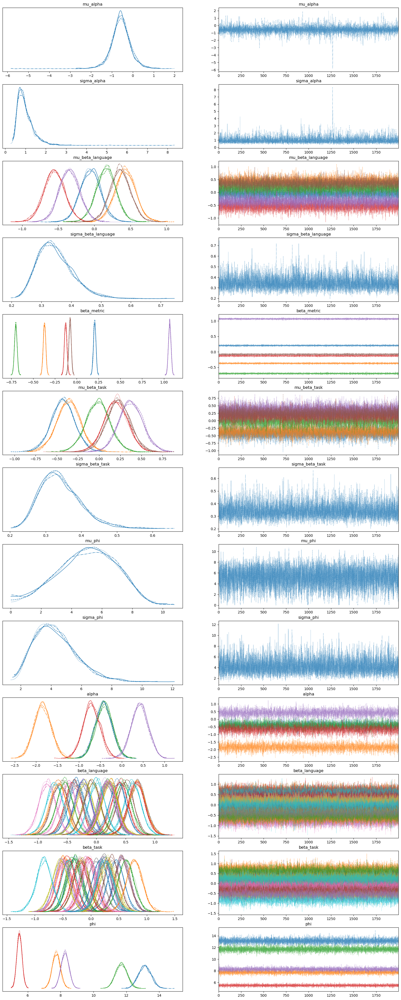

In [73]:
az.plot_trace(cmdstanpy_data,figsize=(20, 50))

In [51]:
beta_metric

array([ 0.215047  , -0.3568547 , -0.72318558, -0.13157244,  1.05489691,
       -0.05833118])

array([[<Axes: title={'center': 'beta_metric'}>,
        <Axes: title={'center': 'beta_metric'}>]], dtype=object)

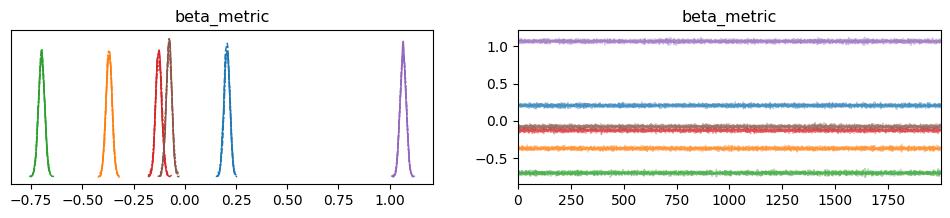

In [52]:
az.plot_trace(cmdstanpy_data, var_names=("beta_metric"))

In [53]:
mu_beta_task

array([-0.40469407, -0.49669201, -0.0640012 ,  0.3106615 ,  0.35683525,
        0.29789053])

array([[<Axes: title={'center': 'mu_beta_task'}>,
        <Axes: title={'center': 'mu_beta_task'}>]], dtype=object)

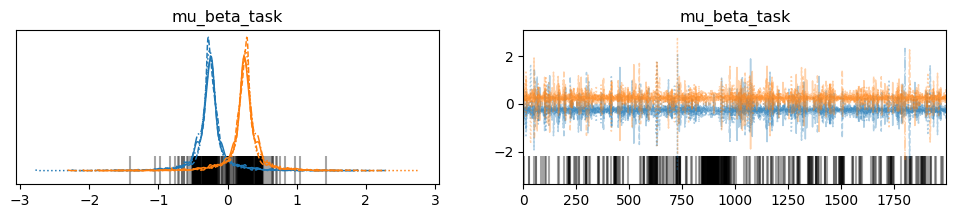

In [34]:
az.plot_trace(cmdstanpy_data, var_names=("mu_beta_task"))

In [97]:
fit.summary()

,Mean,MCSE,StdDev,MAD,5%,50%,95%,ESS_bulk,ESS_tail,R_hat
lp__,362.889000,0.202285,5.628770,5.414460,353.324000,363.167000,371.589000,810.615,437.730,1.00313
mu_alpha,0.560519,0.005837,0.379371,0.314886,-0.039947,0.564936,1.153240,4301.560,4224.910,1.00030
sigma_alpha,0.508549,0.009094,0.400878,0.313025,0.056231,0.418817,1.261290,738.603,353.676,1.00489
mu_beta_language[1],0.228839,0.001182,0.117404,0.101457,0.034377,0.228809,0.416343,10526.400,4724.080,1.00189
mu_beta_language[2],-0.151931,0.001245,0.116522,0.103791,-0.334799,-0.152276,0.032963,8352.750,5188.380,1.00064
...,...,...,...,...,...,...,...,...,...,...
y_hat[476],0.706170,0.000884,0.079253,0.079205,0.566768,0.710642,0.828521,8146.250,7768.400,1.00013
y_hat[477],0.704471,0.000923,0.080925,0.081369,0.563938,0.709352,0.828240,7661.510,8192.060,1.00070
y_hat[478],0.706659,0.000878,0.078904,0.078293,0.570480,0.710125,0.829134,8125.940,7710.350,1.00010
y_hat[479],0.705408,0.000910,0.080034,0.078000,0.566175,0.710206,0.829615,7755.540,7518.460,1.00022


In [100]:
fit.draws_xr()

<xarray.Dataset> Size: 248MB
Dimensions:              (draw: 2000, chain: 4, mu_beta_language_dim_0: 3,
                          beta_metric_dim_0: 2, mu_beta_task_dim_0: 2,
                          alpha_dim_0: 4, beta_language_dim_0: 4,
                          beta_language_dim_1: 3, beta_task_dim_0: 4,
                          beta_task_dim_1: 2, beta_metric_phi_dim_0: 2,
                          beta_task_phi_dim_0: 2, eta_mu_dim_0: 480,
                          mu_dim_0: 480, eta_phi_dim_0: 480, phi_dim_0: 480,
                          a_sim_dim_0: 480, b_sim_dim_0: 480, y_sim_dim_0: 480,
                          y_hat_dim_0: 480)
Coordinates:
  * chain                (chain) int64 32B 1 2 3 4
  * draw                 (draw) int64 16kB 0 1 2 3 4 ... 1996 1997 1998 1999
Dimensions without coordinates: mu_beta_language_dim_0, beta_metric_dim_0,
                                mu_beta_task_dim_0, alpha_dim_0,
                                beta_language_dim_0, beta_language_dim_1,
                                beta_task_dim_0, beta_task_dim_1,
                                beta_metric_phi_dim_0, beta_task_phi_dim_0,
                                eta_mu_dim_0, mu_dim_0, eta_phi_dim_0,
                                phi_dim_0, a_sim_dim_0, b_sim_dim_0,
                                y_sim_dim_0, y_hat_dim_0
Data variables: (12/20)
    mu_alpha             (chain, draw) float64 64kB 0.8311 0.6906 ... 0.4573
    sigma_alpha          (chain, draw) float64 64kB 0.682 0.8967 ... 0.5249
    mu_beta_language     (chain, draw, mu_beta_language_dim_0) float64 192kB ...
    sigma_beta_language  (chain, draw) float64 64kB 0.4662 0.3358 ... 0.3963
    beta_metric          (chain, draw, beta_metric_dim_0) float64 128kB 0.336...
    mu_beta_task         (chain, draw, mu_beta_task_dim_0) float64 128kB 0.26...
    ...                   ...
    eta_phi              (chain, draw, eta_phi_dim_0) float64 31MB 1.313 ... ...
    phi                  (chain, draw, phi_dim_0) float64 31MB 3.716 ... 31.86
    a_sim                (chain, draw, a_sim_dim_0) float64 31MB 6.2 ... 0.01903
    b_sim                (chain, draw, b_sim_dim_0) float64 31MB 41.53 ... 0....
    y_sim                (chain, draw, y_sim_dim_0) float64 31MB 0.1055 ... 0.01
    y_hat                (chain, draw, y_hat_dim_0) float64 31MB 0.9859 ... 0...
Attributes:
    stan_version:        2.36.0
    model:               simple_model_hierarchical_model
    num_draws_sampling:  2000

In [118]:
temp = {}
grouop_keys = ["group", "language", "metric", "task"]

temp["mu"][grouop_keys[1]] = [1,2,3,4]
temp

KeyError: 'mu'

In [113]:
temp["mu"]["1"]

1

In [98]:
import arviz as az

cmdstanpy_data = az.from_cmdstanpy(
    posterior=fit,
    # posterior_predictive="y_hat",
    observed_data={"y": stan_data["y"]},
    posterior_predictive="y_hat",
    # log_likelihood="log_lik",
    # coords={"language": np.arange(data["language"])},
    # dims={
    #     "theta": ["school"],
    #     "y": ["school"],
    #     "log_lik": ["school"],
    #     "y_hat": ["school"],
    #     "theta_tilde": ["school"],
    # },
)
cmdstanpy_data

Inference data with groups:
	> posterior
	> posterior_predictive
	> sample_stats
	> observed_data

In [96]:
cmdstanpy_data.posterior["mu_alpha"].values.flatten().mean()

0.5605185318781

<Axes: title={'center': 'mu_beta_language'}>

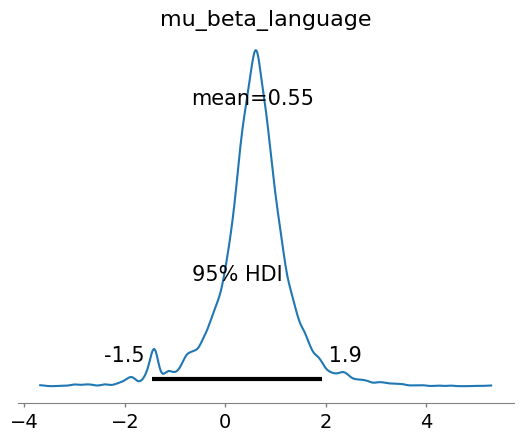

In [41]:
cmdstanpy_data
contrast = cmdstanpy_data.posterior["mu_beta_language"].sel(mu_beta_language_dim_0=0) - \
           cmdstanpy_data.posterior["mu_beta_language"].sel(mu_beta_language_dim_0=1)
az.plot_posterior(contrast, hdi_prob=0.95)

array([<Axes: title={'center': 'beta_language\n0'}>,
       <Axes: title={'center': 'beta_language\n1'}>], dtype=object)

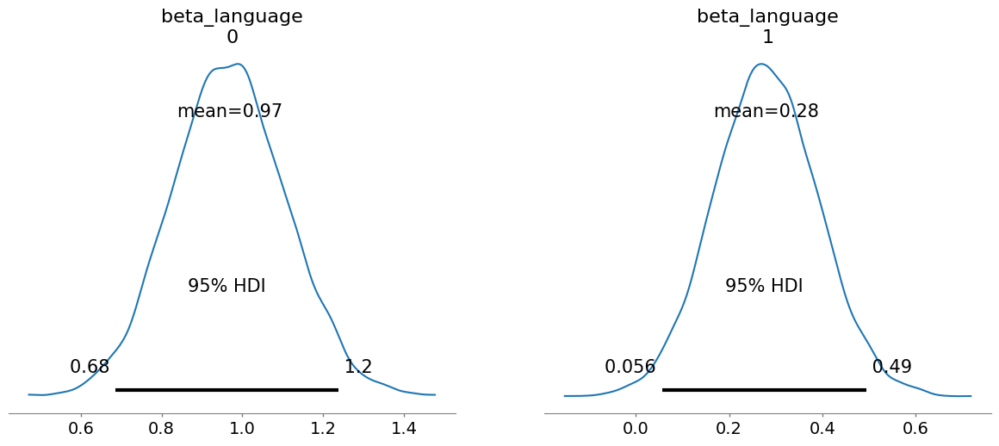

In [55]:
cmdstanpy_data
contrast = cmdstanpy_data.posterior["beta_language"].sel(beta_language_dim_1=0) - \
           cmdstanpy_data.posterior["beta_language"].sel(beta_language_dim_1=1)
az.plot_posterior(contrast, hdi_prob=0.95)

In [53]:
cmdstanpy_data.posterior["beta_language"].sel(beta_language_dim_0=1)

<xarray.DataArray 'beta_language' (chain: 4, draw: 2000,
                                   beta_language_dim_0: 2,
                                   beta_language_dim_1: 2)> Size: 256kB
array([[[[ 5.56560e-01, -3.44741e-01],
         [ 2.05296e-01,  1.42951e-02]],

        [[ 3.12080e-01, -8.55499e-01],
         [ 4.21468e-01,  1.21137e-01]],

        [[-1.85790e-01, -8.38411e-01],
         [ 1.37366e-01, -1.57317e-01]],

        ...,

        [[ 3.55724e-01, -5.26817e-01],
         [ 1.76065e-01, -2.36189e-01]],

        [[ 3.18269e-01, -8.33196e-01],
         [ 6.55918e-01,  4.21411e-01]],

        [[ 4.95424e-01, -5.47561e-01],
         [-2.72511e-01, -5.86405e-01]]],

...

       [[[ 2.89446e-01, -6.76371e-01],
         [ 6.33226e-01,  3.43803e-01]],

        [[ 2.89977e-01, -7.63409e-01],
         [ 2.19360e-01,  5.98824e-04]],

        [[ 2.80661e-01, -5.35889e-01],
         [ 4.57335e-02, -2.85458e-01]],

        ...,

        [[ 4.68282e-01, -4.31777e-01],
         [ 1.52070e-01, -1.62894e-01]],

        [[ 4.43587e-01, -4.46165e-01],
         [ 1.96068e-01, -1.66168e-01]],

        [[ 4.03143e-01, -4.36823e-01],
         [ 1.14732e-01, -2.00787e-01]]]])
Coordinates:
  * chain                (chain) int64 32B 0 1 2 3
  * draw                 (draw) int64 16kB 0 1 2 3 4 ... 1996 1997 1998 1999
  * beta_language_dim_0  (beta_language_dim_0) int64 16B 0 1
  * beta_language_dim_1  (beta_language_dim_1) int64 16B 0 1

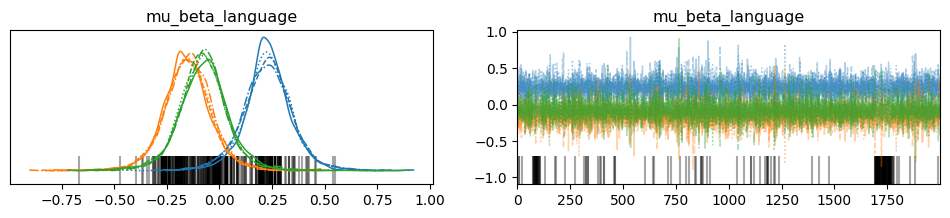

In [120]:
fig = az.plot_trace(cmdstanpy_data, var_names=("mu_beta_language"))

In [127]:
fig.ravel()[0].figure.savefig("mu_beta_language.png", dpi=300, bbox_inches='tight')

array([[<Axes: title={'center': 'beta_language'}>,
        <Axes: title={'center': 'beta_language'}>]], dtype=object)

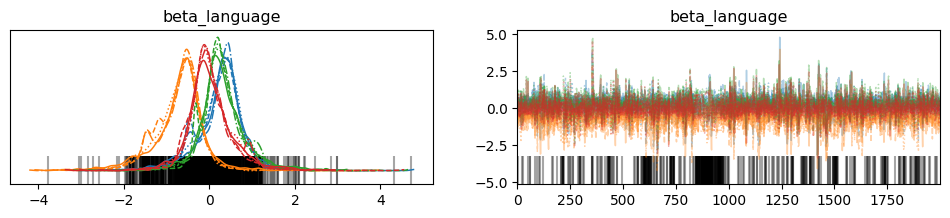

In [37]:
az.plot_trace(cmdstanpy_data, var_names=("beta_language"))

array([<Axes: title={'center': '94.0% HDI'}>,
       <Axes: title={'center': 'ess'}>], dtype=object)

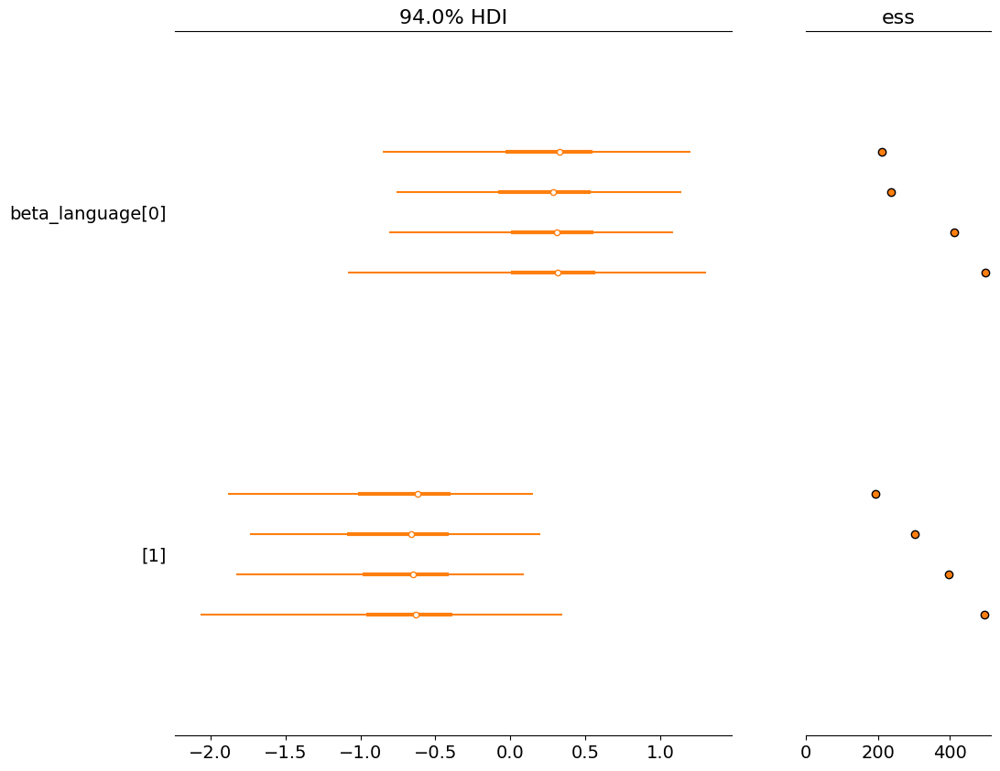

In [35]:
az.plot_forest(
    cmdstanpy_data,
    var_names=["beta_language"],
    figsize=(11.5, 10),
    colors="C1",
    ess=True,
    coords = {"beta_language_dim_0": [0]},
        
    # r_hat=True,
)

In [24]:
cmdstanpy_data

Inference data with groups:
	> posterior
	> sample_stats
	> observed_data

In [37]:
centered_eight = az.load_arviz_data('centered_eight')

In [38]:
centered_eight

Inference data with groups:
	> posterior
	> posterior_predictive
	> log_likelihood
	> sample_stats
	> prior
	> prior_predictive
	> observed_data
	> constant_data

<Axes: title={'center': 'mu_beta_language\n0'}>

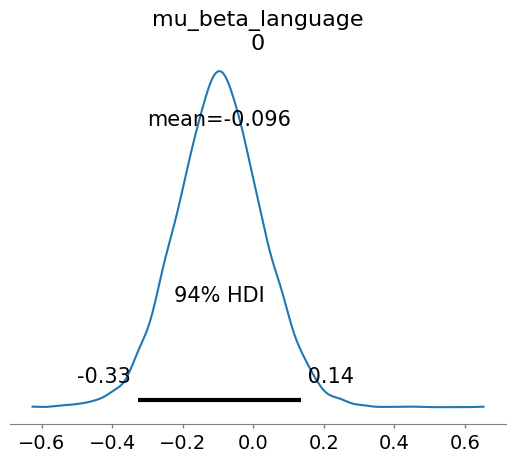

In [55]:
coords = {"mu_beta_language_dim_0": [0]}
az.plot_posterior(cmdstanpy_data, var_names=("mu_beta_language"), coords=coords)

array([[<Axes: title={'center': 'mu'}>,
        <Axes: title={'center': 'theta\nChoate'}>,
        <Axes: title={'center': 'theta\nDeerfield'}>],
       [<Axes: title={'center': 'theta\nPhillips Andover'}>,
        <Axes: title={'center': 'theta\nPhillips Exeter'}>,
        <Axes: title={'center': 'theta\nHotchkiss'}>],
       [<Axes: title={'center': 'theta\nLawrenceville'}>,
        <Axes: title={'center': "theta\nSt. Paul's"}>,
        <Axes: title={'center': 'theta\nMt. Hermon'}>]], dtype=object)

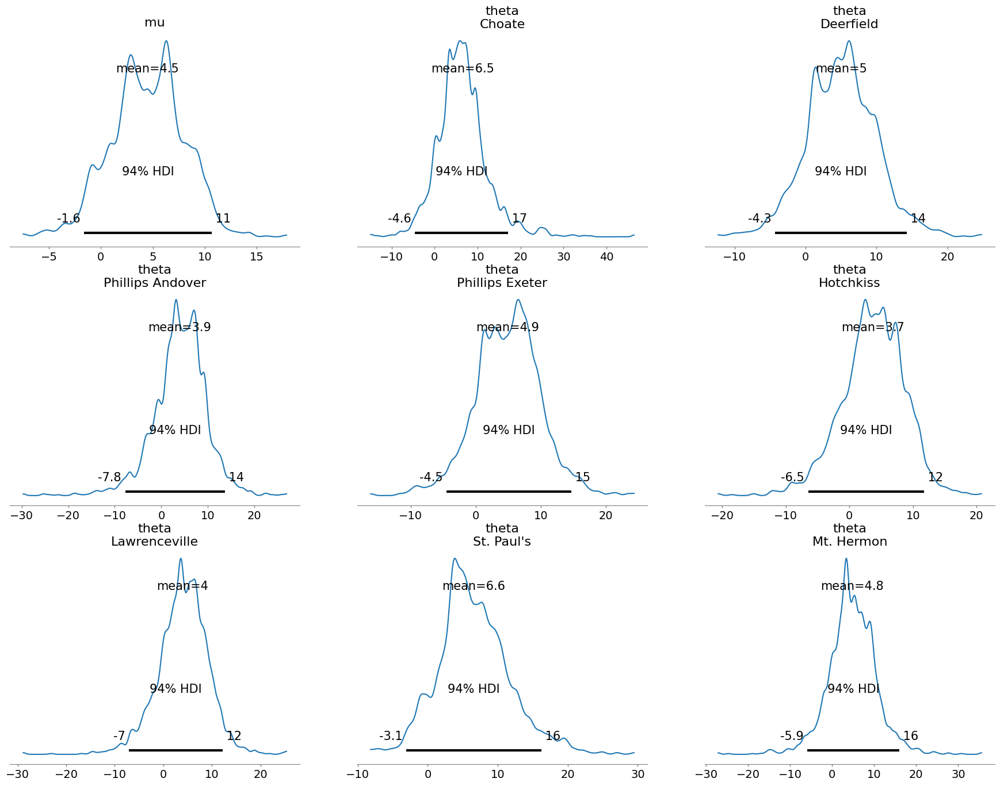

In [46]:
coords = {"school": ["Mt. Hermon", "Phillips Exeter"]}
az.plot_posterior(centered_eight, var_names=["mu", "theta"])

In [18]:
fit.summary()

,Mean,MCSE,StdDev,MAD,5%,50%,95%,ESS_bulk,ESS_tail,R_hat
lp__,125.744000,0.179993,5.096900,5.080870,116.898000,125.952000,133.549000,777.880,1433.600,1.007270
mu_alpha,-0.734010,0.016511,0.802249,0.652798,-1.942360,-0.770435,0.611278,2264.590,2601.500,1.000640
sigma_alpha,0.856857,0.016894,0.718986,0.555624,0.073429,0.694206,2.212480,818.081,338.564,1.003760
mu_beta_language[1],0.273448,0.014063,0.390785,0.261681,-0.414152,0.294934,0.850177,1221.110,236.421,1.003140
mu_beta_language[2],-0.273448,0.014063,0.390785,0.261681,-0.850177,-0.294934,0.414152,1221.110,236.421,1.003140
...,...,...,...,...,...,...,...,...,...,...
y_hat[156],0.421823,0.000983,0.088023,0.089445,0.280477,0.419800,0.569790,8064.650,7810.670,1.000680
y_hat[157],0.423157,0.001019,0.087753,0.088057,0.284495,0.420254,0.570627,7465.390,7917.030,0.999905
y_hat[158],0.422764,0.000991,0.089128,0.092686,0.280336,0.420970,0.571269,8103.950,7356.820,1.000010
y_hat[159],0.422569,0.001009,0.088380,0.089158,0.280633,0.419150,0.573440,7706.340,7550.200,1.000090


In [31]:
fit.save_csvfiles(dir="output")

In [11]:
import arviz as az

cmdstanpy_data = az.from_cmdstanpy(
    posterior=fit,
    # posterior_predictive="y_hat",
    observed_data={"y": stan_data["y"]},
    posterior_predictive="y_hat",
    prior_predictive="y_sim",
    
    # log_likelihood="log_lik",
    # coords={"language": np.arange(data["language"])},
    # dims={
    #     "theta": ["school"],
    #     "y": ["school"],
    #     "log_lik": ["school"],
    #     "y_hat": ["school"],
    #     "theta_tilde": ["school"],
    # },
)

cmdstanpy_data_prior = az.from_cmdstanpy(
    posterior=fit,
    # posterior_predictive="y_hat",
    # observed_data={"y": stan_data["y"]},
    posterior_predictive="y_sim",
)

cmdstanpy_data

Inference data with groups:
	> posterior
	> posterior_predictive
	> sample_stats
	> observed_data

array([[<Axes: title={'center': 'mu_beta_language\n0'}>,
        <Axes: title={'center': 'mu_beta_language\n1'}>,
        <Axes: title={'center': 'mu_beta_language\n2'}>]], dtype=object)

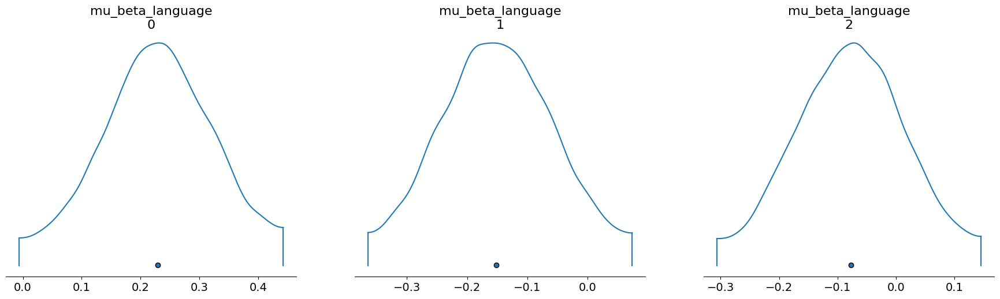

In [54]:
az.plot_density(cmdstanpy_data, var_names=["mu_beta_language"])

In [75]:
cmdstanpy_data

Inference data with groups:
	> posterior
	> posterior_predictive
	> sample_stats
	> observed_data

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

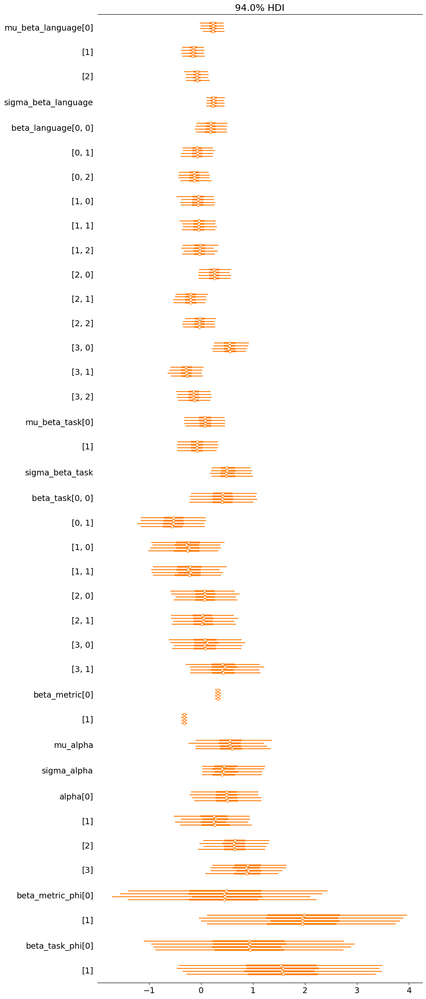

In [81]:
az.plot_forest(
    cmdstanpy_data,
    var_names=["mu_beta_language", "sigma_beta_language", "beta_language", "mu_beta_task", "sigma_beta_task", "beta_task", "beta_metric", "mu_alpha", "sigma_alpha", "alpha", "beta_metric_phi", "beta_task_phi"],
    figsize=(10, 30),
    colors="C1",
)

In [29]:
az.InferenceData(posterior=fit.draws_xr())

Inference data with groups:
	> posterior

In [ ]:
az.plot_ppc(cmdstanpy_data_prior, data_pairs={"y":"y_sim"})

TypeError: `data` argument must have the group "observed_data" for ppcplot

In [28]:
az.plot_density(
    cmdstanpy_data,
    group="prior",
    var_names=["mu_beta_language"],
)

ValueError: Can not extract prior from Inference data with groups:
	> posterior
	> posterior_predictive
	> sample_stats
	> observed_data! See /Users/au619572/.virtualenvs/cogmod_llm/lib/python3.12/site-packages/arviz/data/converters.py for other conversion utilities.

/var/folders/dc/w87jpcmd6sb1lgc7yrpykznrhgqz3l/T/ipykernel_29872/55861781.py:13: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=False`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data, shade=False, color=f"C{i}", lw=1, alpha=0.3)
/var/folders/dc/w87jpcmd6sb1lgc7yrpykznrhgqz3l/T/ipykernel_29872/55861781.py:13: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=False`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data, shade=False, color=f"C{i}", lw=1, alpha=0.3)
/var/folders/dc/w87jpcmd6sb1lgc7yrpykznrhgqz3l/T/ipykernel_29872/55861781.py:13: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=False`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data, shade=False, color=f"C{i}", lw=1, alpha=0.3)
/var/folders/dc/w87jpcmd6sb1lgc7yrpykznrhgqz3l/T/ipykernel_29872/55861781.py:13: FutureWarn

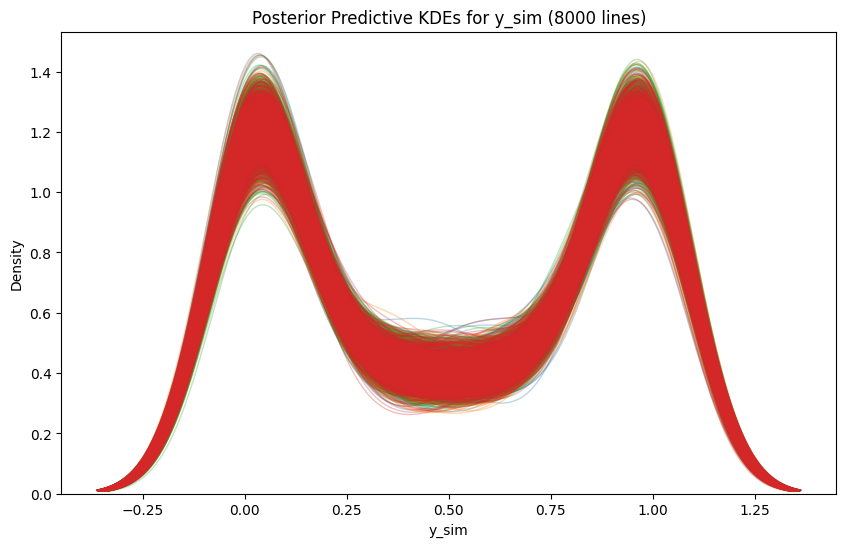

In [52]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming y_sim has shape (4, 2000, N) where N is the number of predicted points per run
# For example, cmdstanpy_data.posterior["y_sim"] is a NumPy array.
y_sim = cmdstanpy_data.posterior["y_sim"]

plt.figure(figsize=(10, 6))
for i in range(4):
    for j in range(2000):
        # If y_sim is a NumPy array, you can index it like this:
        data = y_sim[i, j, :]
        sns.kdeplot(data, shade=False, color=f"C{i}", lw=1, alpha=0.3)
plt.xlabel("y_sim")
plt.ylabel("Density")
plt.title("Posterior Predictive KDEs for y_sim (8000 lines)")
plt.show()

/var/folders/dc/w87jpcmd6sb1lgc7yrpykznrhgqz3l/T/ipykernel_29872/3873659520.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(y_sim_values, shade=True, color="skyblue")


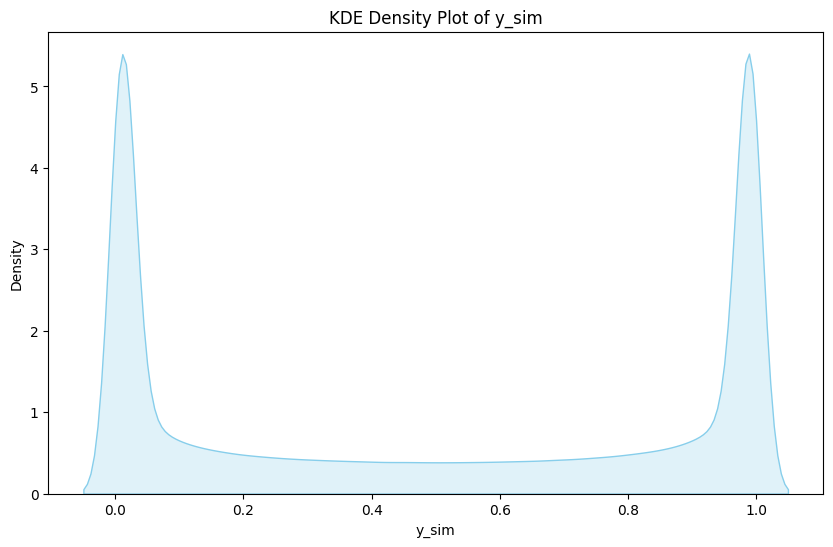

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt

y_sim_values = cmdstanpy_data.posterior["y_sim"].values.flatten()

plt.figure(figsize=(10,6))
sns.kdeplot(y_sim_values, shade=True, color="skyblue")
plt.xlabel("y_sim")
plt.ylabel("Density")
plt.title("KDE Density Plot of y_sim")
plt.show()


/Users/au619572/.virtualenvs/cogmod_llm/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


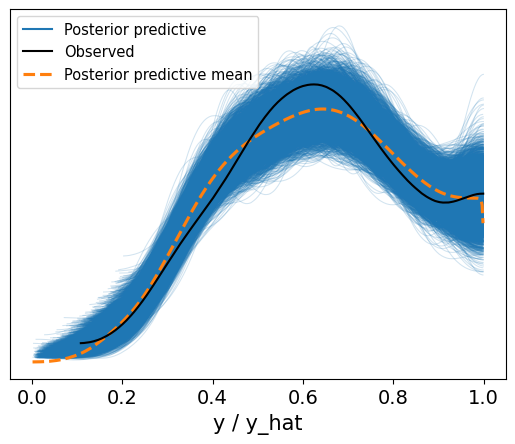

In [134]:
fig.figure

AttributeError: 'Axes' object has no attribute 'ravel'

/Users/au619572/.virtualenvs/cogmod_llm/lib/python3.12/site-packages/IPython/core/events.py:82: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Users/au619572/.virtualenvs/cogmod_llm/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


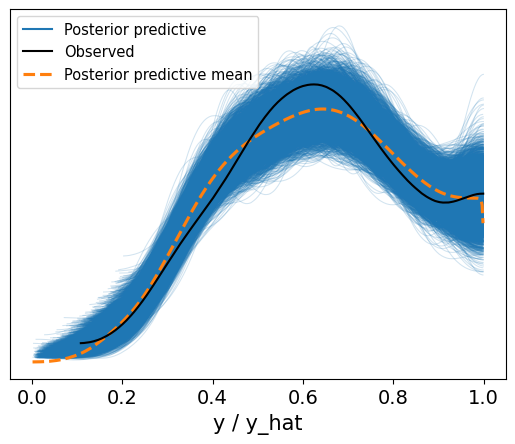

In [128]:
fig = az.plot_ppc(cmdstanpy_data, data_pairs={"y":"y_hat"})

fig.ravel()[0].figure

<Axes: xlabel='y / y_hat'>

/Users/au619572/.virtualenvs/cogmod_llm/lib/python3.12/site-packages/IPython/core/events.py:82: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Users/au619572/.virtualenvs/cogmod_llm/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


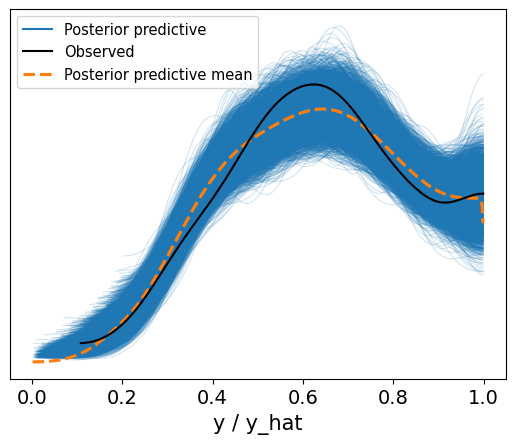

In [ ]:
az.plot_ppc(cmdstanpy_data, data_pairs={"y":"y_hat"})

In [29]:
schools = az.load_arviz_data("non_centered_eight")

In [25]:
schools

Inference data with groups:
	> posterior
	> posterior_predictive
	> log_likelihood
	> sample_stats
	> prior
	> prior_predictive
	> observed_data
	> constant_data

array([[<Axes: title={'center': 'mu'}>]], dtype=object)

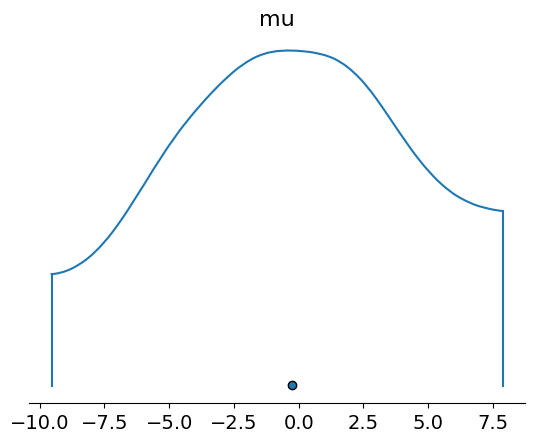

In [32]:
az.plot_density(
    schools,
    group="prior",
    var_names=["mu"],
)

In [33]:
az.plot_ppc(fit)

TypeError: `data` argument must have the group "posterior_predictive" for ppcplot

/Users/au619572/.virtualenvs/cogmod_llm/lib/python3.12/site-packages/arviz/plots/ppcplot.py:242: FutureWarning: color has been deprecated in favor of colors
  warnings.warn("color has been deprecated in favor of colors", FutureWarning)


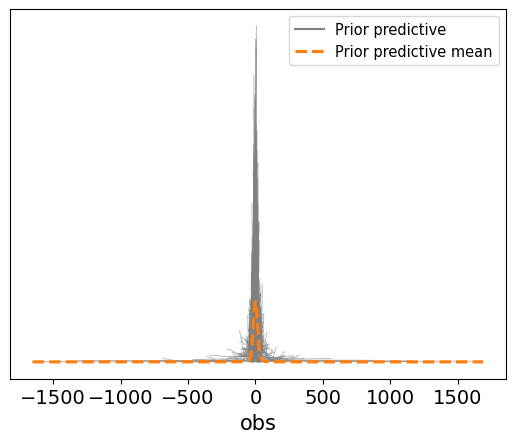

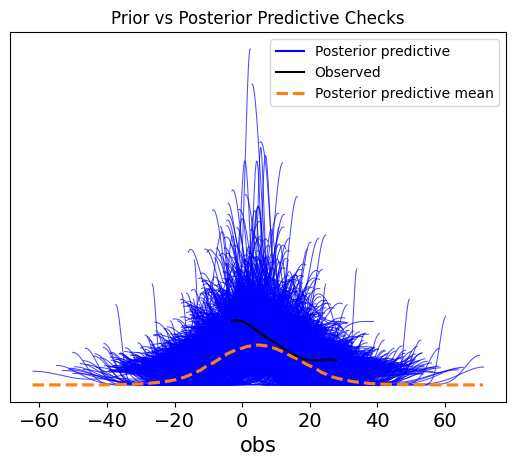

In [ ]:
# Replace 'idata' with your actual InferenceData object
# Ensure it has both 'prior' and 'posterior' groups

az.plot_ppc(data=schools, group='prior', kind='kde', alpha=0.5, color='gray')
az.plot_ppc(data=schools, group='posterior', kind='kde', alpha=0.7, color='blue')
plt.legend()
plt.title("Prior vs Posterior Predictive Checks")
plt.show()

In [84]:
schools

Inference data with groups:
	> posterior
	> posterior_predictive
	> log_likelihood
	> sample_stats
	> prior
	> prior_predictive
	> observed_data
	> constant_data

array([[<Axes: >, <Axes: >, <Axes: xlabel='mu'>],
       [<Axes: >, <Axes: >, <Axes: xlabel='tau'>]], dtype=object)

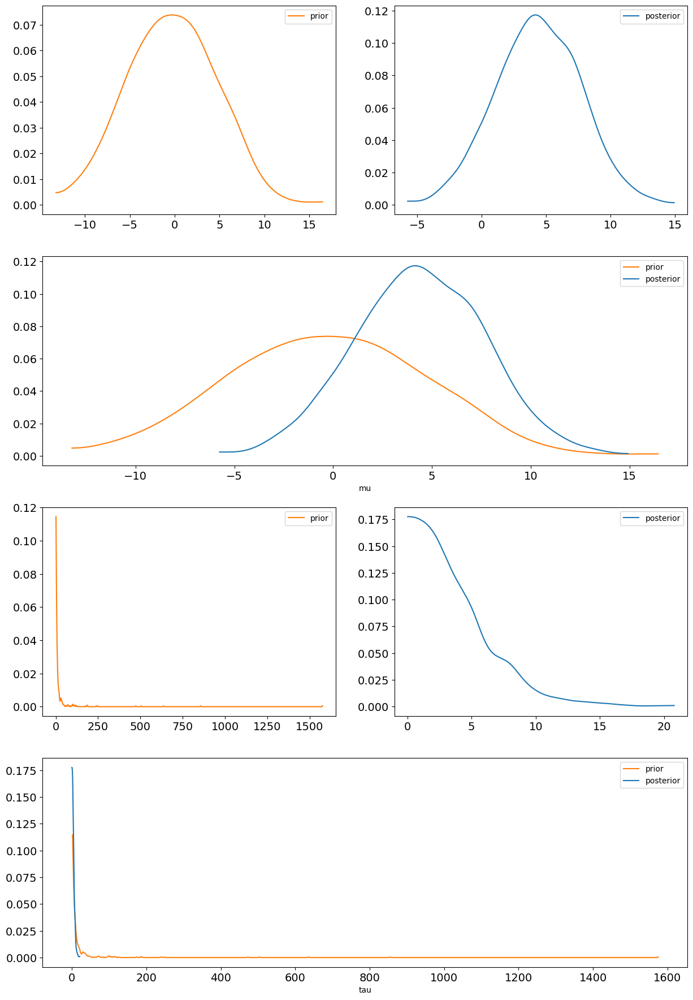

In [87]:
# Plot KDEs of parameters in prior and posterior groups
az.plot_dist_comparison(data=schools, var_names=["mu", "tau", ])